<a href="https://colab.research.google.com/github/anh-honcharuk/Neural-Networks/blob/main/lec_3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import warnings
warnings.simplefilter('ignore')

%matplotlib inline
import seaborn as sns
import matplotlib.pyplot as plt
#графики в svg выглядят более четкими
%config InlineBackend.figure_format = 'svg'

#увеличим дефолтный размер графиков 
from pylab import rcParams
rcParams['figure.figsize'] = 8, 5
import pandas as pd

In [ ]:
from google.colab import files
files.upload()

Saving video_games_sales.csv - video_games_sales.csv.csv to video_games_sales.csv - video_games_sales.csv (1).csv


{'video_games_sales.csv - video_games_sales.csv.csv': b'Name,Platform,Year_of_Release,Genre,Publisher,NA_Sales,EU_Sales,JP_Sales,Other_Sales,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Developer,Rating\r\nWii Sports,Wii,2006,Sports,Nintendo,41.36,28.96,3.77,8.45,82.53,76,51,8,322,Nintendo,E\r\nSuper Mario Bros.,NES,1985,Platform,Nintendo,29.08,3.58,6.81,0.77,40.24,,,,,,\r\nMario Kart Wii,Wii,2008,Racing,Nintendo,15.68,12.76,3.79,3.29,35.52,82,73,8.3,709,Nintendo,E\r\nWii Sports Resort,Wii,2009,Sports,Nintendo,15.61,10.93,3.28,2.95,32.77,80,73,8,192,Nintendo,E\r\nPokemon Red/Pokemon Blue,GB,1996,Role-Playing,Nintendo,11.27,8.89,10.22,1,31.37,,,,,,\r\nTetris,GB,1989,Puzzle,Nintendo,23.2,2.26,4.22,0.58,30.26,,,,,,\r\nNew Super Mario Bros.,DS,2006,Platform,Nintendo,11.28,9.14,6.5,2.88,29.8,89,65,8.5,431,Nintendo,E\r\nWii Play,Wii,2006,Misc,Nintendo,13.96,9.18,2.93,2.84,28.92,58,41,6.6,129,Nintendo,E\r\nNew Super Mario Bros. Wii,Wii,2009,Platform,Nintendo,14.44,6.94,4.7,2.2

In [ ]:
df = pd.read_csv('video_games_sales.csv - video_games_sales.csv.csv')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16719 entries, 0 to 16718
Data columns (total 16 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Name             16717 non-null  object 
 1   Platform         16719 non-null  object 
 2   Year_of_Release  16450 non-null  float64
 3   Genre            16717 non-null  object 
 4   Publisher        16665 non-null  object 
 5   NA_Sales         16719 non-null  float64
 6   EU_Sales         16719 non-null  float64
 7   JP_Sales         16719 non-null  float64
 8   Other_Sales      16719 non-null  float64
 9   Global_Sales     16719 non-null  float64
 10  Critic_Score     8137 non-null   float64
 11  Critic_Count     8137 non-null   float64
 12  User_Score       10015 non-null  object 
 13  User_Count       7590 non-null   float64
 14  Developer        10096 non-null  object 
 15  Rating           9950 non-null   object 
dtypes: float64(9), object(7)
memory usage: 2.0+ MB


In [ ]:
df['User_Score'] = df.User_Score.astype('float64', errors='ignore') 
df['Year_of_Release'] = df.Year_of_Release.astype('int64', errors='ignore') 
df['User_Count'] = df.User_Count.astype('int64', errors='ignore') 
df['Critic Count'] = df.Critic_Count.astype('int64', errors='ignore')  

In [ ]:
df = df.dropna() 
print(df.shape)

(6825, 17)


In [ ]:
useful_cols = ['Name', 'Platform', 'Year_of_Release', 'Genre', 
               'Global_Sales', 'Critic_Score', 'Critic_Count',
               'User_Score', 'User_Count', 'Rating'
              ]
df[useful_cols].head()

,Name,Platform,Year_of_Release,Genre,Global_Sales,Critic_Score,Critic_Count,User_Score,User_Count,Rating
0,Wii Sports,Wii,2006.0,Sports,82.53,76.0,51.0,8,322.0,E
2,Mario Kart Wii,Wii,2008.0,Racing,35.52,82.0,73.0,8.3,709.0,E
3,Wii Sports Resort,Wii,2009.0,Sports,32.77,80.0,73.0,8,192.0,E
6,New Super Mario Bros.,DS,2006.0,Platform,29.80,89.0,65.0,8.5,431.0,E
7,Wii Play,Wii,2006.0,Misc,28.92,58.0,41.0,6.6,129.0,E


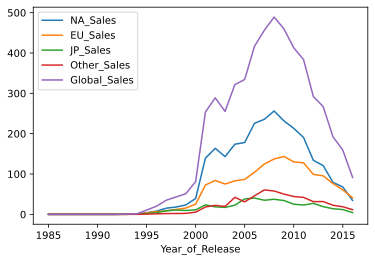

In [ ]:
sales_df = df[[x for x in df.columns if 'Sales' in  x] + ['Year_of_Release']]
sales_df.groupby('Year_of_Release').sum().plot()

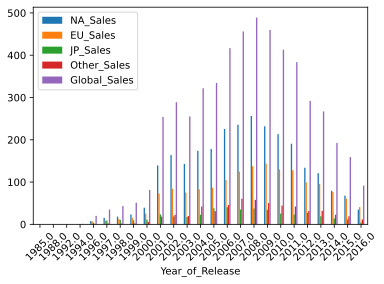

In [ ]:
sales_df.groupby('Year_of_Release').sum().plot(kind='bar', rot=45)

In [ ]:
cols = ['Global_Sales', 'Critic_Score', 'Critic_Count', 'User_Score', 'User_Count'] 
sns_plot = sns.pairplot(df[cols]) 
sns_plot.savefig('pairplot.png') 